<a href="https://colab.research.google.com/github/RH-Pronoy/BlackList/blob/main/cauli_flower_densenet121_(2nd_version).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pandas pillow

In [ ]:
!pip install pandas
!pip install opencv-python

In [ ]:
!pip install tensorflow==2.12.0
!pip install keras

INFO: pip is looking at multiple versions of jax to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of jax to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.9/585.9 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 63.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 82.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 91.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.6/79.6 MB 20.6 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.0
    Uninst

In [ ]:
!pip install -q datasets

In [ ]:
import numpy as np
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import os
from tensorflow import keras
import glob as gb
import pandas as pd
from tensorflow.keras.preprocessing import image_dataset_from_directory
# Import RandomFlip and RandomRotation from the preprocessing module
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.layers import Conv2D, MaxPool2D, LeakyReLU

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory

IMG_SIZE = (299, 299) # resolution
directory = "/kaggle/input/cauli-flower-diseases-dataset-from-bangladesh/Cauli Flower Diseases Dataset From Bangladesh"
BATCH_SIZE = 128

train_dataset = image_dataset_from_directory(directory,
                                             shuffle=True,
                                             labels='inferred',
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             validation_split=0.1,
                                             subset='training',
                                             color_mode='rgb',
                                             seed=42)

validation_dataset = image_dataset_from_directory(directory,
                                             shuffle=True,
                                             labels='inferred',
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             validation_split=0.1,
                                             subset='validation',
                                             color_mode='rgb',
                                             seed=42)


Found 7360 files belonging to 4 classes.
Using 6624 files for training.
Found 7360 files belonging to 4 classes.
Using 736 files for validation.


In [ ]:
class_names = train_dataset.class_names
class_names

['Bacterial spot rot', 'Black Rot', 'Disease Free', 'Downy Mildew']

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


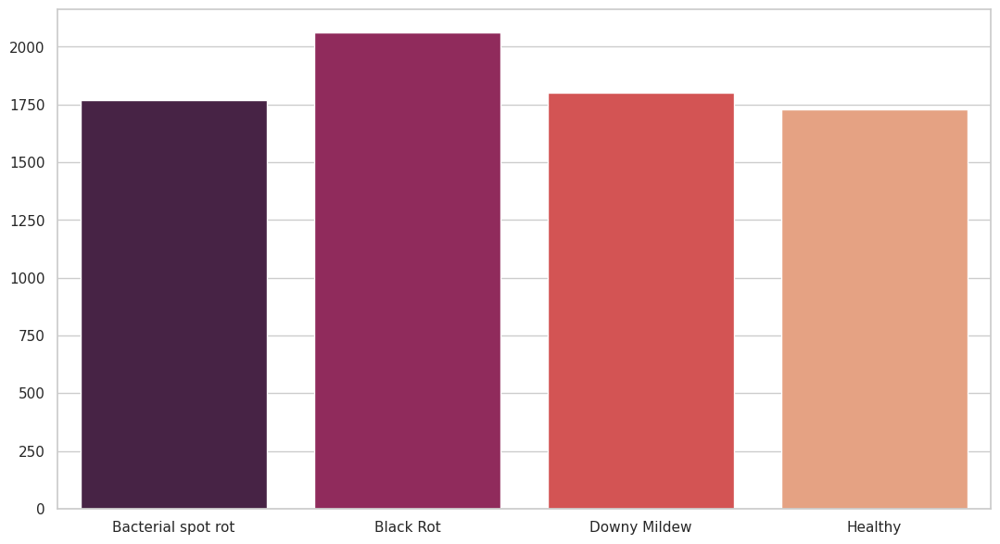

In [ ]:
sns.set_theme(style="whitegrid")
Data_imbalance = []
for folder in os.listdir(directory):
    files = gb.glob(pathname=str(directory + "/" + folder +"/*.*"))
    Data_imbalance.append(len(files))
plt.figure(figsize=(13,7))
sns.barplot(x=['Bacterial spot rot', 'Black Rot', 'Downy Mildew', 'Healthy'], y=Data_imbalance, palette="rocket")
plt.show()


In [ ]:
total = 0
for i in range(0,len(Data_imbalance)) :
    total +=Data_imbalance[i]

weight_for_0 = (1 / Data_imbalance[0]) * (total / 4.0)
weight_for_1 = (1 / Data_imbalance[1]) * (total / 4.0)
weight_for_2 = (1 / Data_imbalance[2]) * (total / 4.0)
weight_for_3 = (1 / Data_imbalance[3]) * (total / 4.0)

class_weight = {0: weight_for_0, 1: weight_for_1, 2: weight_for_2, 3: weight_for_3}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))
print('Weight for class 2: {:.2f}'.format(weight_for_2))
print('Weight for class 3: {:.2f}'.format(weight_for_3))

Weight for class 0: 1.04
Weight for class 1: 0.89
Weight for class 2: 1.02
Weight for class 3: 1.06


In [ ]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip("horizontal"),
  tf.keras.layers.RandomRotation(0.2),
  tf.keras.layers.RandomZoom(0.2),
  tf.keras.layers.RandomHeight(0.2),
  tf.keras.layers.RandomWidth(0.2),
])

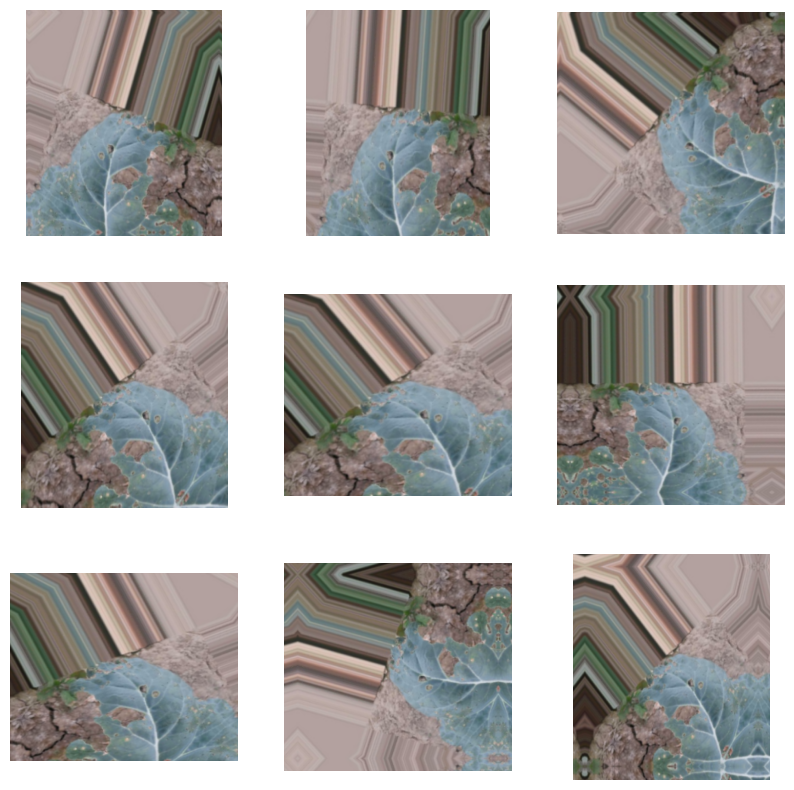

In [ ]:
for image, _ in train_dataset.take(1):
    plt.figure(figsize=(10, 10))
    first_image = image[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
        plt.imshow(augmented_image[0] / 255)
        plt.axis('off')

**Brown RUST**

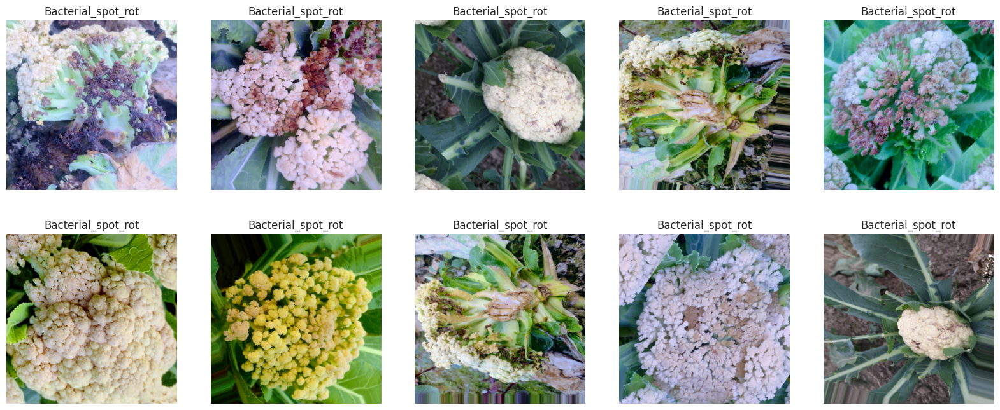

In [ ]:
plt.figure(figsize=(20,8))
Bacterial_spot_rot = []
Black_Rot= []
Downy_Mildew =[]


for images , labels in train_dataset.take(1):
    for i in range(100):
        if class_names[labels[i]] == "Bacterial spot rot":
            Bacterial_spot_rot.append(images[i].numpy().astype("uint8"))
        if  class_names[labels[i]] == "Black Rot":
            Black_Rot.append(images[i].numpy().astype("uint8"))
        if  class_names[labels[i]] == "Downy Mildew":
           Downy_Mildew.append(images[i].numpy().astype("uint8"))

for i in range(10):
    plt.subplot(2,5,i+1)
    plt.imshow(Bacterial_spot_rot[i])
    plt.axis("off")
    plt.title("Bacterial_spot_rot")

**BLACK ROT**

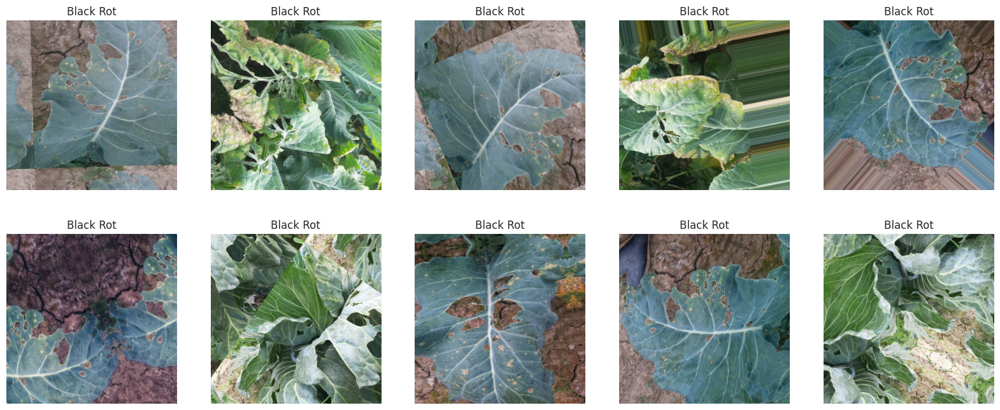

In [ ]:
plt.figure(figsize=(20,8))
for i in range(min(10, len(Black_Rot))): # Changed to display up to 10 or the available images
    plt.subplot(2,5,i+1)
    plt.imshow(Black_Rot[i])
    plt.axis("off")
    plt.title("Black Rot")

**Downy_Mildew**

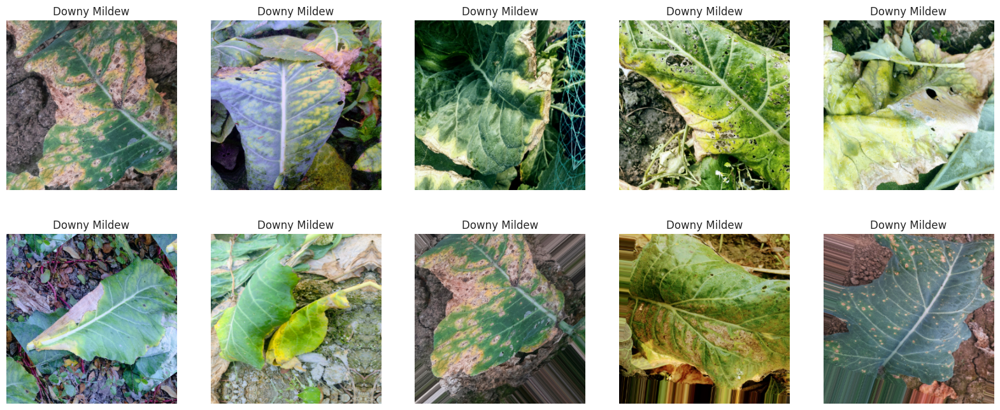

In [ ]:
plt.figure(figsize=(20,8))
for i in range(10):
    plt.subplot(2,5,i+1)
    plt.imshow(Downy_Mildew[i])
    plt.axis("off")
    plt.title("Downy Mildew")


In [ ]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)

**MODELING**

In [ ]:
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.DenseNet121(input_shape=IMG_SHAPE, include_top=False, weights='imagenet')


29084464/29084464 [==============================] - 0s 0us/step


In [ ]:
type(base_model)
preprocess_input = tf.keras.applications.densenet.preprocess_input


In [ ]:
nb_layers = len(base_model.layers)
print("Number of Layers =", nb_layers)
print(base_model.layers[-2].name)  # Pre-last layer name
print(base_model.layers[-1].name)  # Last layer name


Number of Layers = 427
bn
relu


In [ ]:
# Ensure base_model is a TensorFlow model and in inference mode
image_batch, label_batch = next(iter(train_dataset))  # Get a batch of images

# Run the base model on the batch to extract features
feature_batch = base_model(image_batch, training=False)

# Print the feature map shape
print("Feature batch shape:", feature_batch.shape)


Feature batch shape: (128, 9, 9, 1024)


**DenseNet 121**

In [ ]:
import tensorflow as tf

def plant_leaf_model(image_shape=IMG_SIZE):
    """Define a tf.keras model using DenseNet121 for multi-class classification."""
    image_shape = image_shape + (3,)  # Ensure input shape includes color channels

    # Load the DenseNet121 model (pretrained on ImageNet) without the top layer
    base_model = tf.keras.applications.DenseNet121(input_shape=image_shape, include_top=False, weights='imagenet')

    # Set all layers to trainable, but freeze the first few for transfer learning
    base_model.trainable = True
    for layer in base_model.layers[:300]:  # Freeze the first 300 layers
        layer.trainable = False

    # Define the model architecture
    inputs = tf.keras.Input(shape=image_shape)
    x = data_augmentation(inputs)  # Apply data augmentation
    x = preprocess_input(inputs)  # Apply preprocessing
    x = base_model(x, training=False)  # Extract features using DenseNet121
    x = tf.keras.layers.GlobalAveragePooling2D()(x)  # Global Average Pooling
    x = tf.keras.layers.Dropout(0.2)(x)  # Dropout for regularization
    prediction_layer = tf.keras.layers.Dense(4, activation="softmax")  # Output layer (4 classes)
    outputs = prediction_layer(x)

    # Create the final model
    model = tf.keras.Model(inputs, outputs)
    model.summary()

    return model


In [ ]:
Plant_Leaf_Model = plant_leaf_model(IMG_SIZE)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 299, 299, 3)      0         
 )                                                               
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 299, 299, 3)      0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 299, 299, 3)      0         
 da)                                                             
                                                                 
 densenet121 (Functional)    (None, 9, 9, 1024)        7037504   
                                                                 
 global_average_pooling2d (G  (None, 1024)             0     

In [ ]:
# Set a lower base learning rate
base_learning_rate = 0.0001  # Suggested: 1e-4 or 1e-3

# Compile the model
Plant_Leaf_Model.compile(
    optimizer=tf.keras.optimizers.Nadam(learning_rate=base_learning_rate),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)


In [ ]:
history = Plant_Leaf_Model.fit(
    train_dataset,
    epochs=10,
    class_weight=class_weight,
    validation_data=validation_dataset,
    verbose=1,  # Change to 1 for a cleaner output
    workers=-1,  # Use all available CPU cores for faster training
    use_multiprocessing=True  # Keep this for multi-core processing
)


Epoch 1/10
52/52 [==============================] - 1452s 27s/step - loss: 0.2357 - accuracy: 0.9103 - val_loss: 0.0073 - val_accuracy: 0.9973
Epoch 2/10
52/52 [==============================] - 1422s 27s/step - loss: 0.0052 - accuracy: 0.9988 - val_loss: 7.8008e-04 - val_accuracy: 1.0000
Epoch 3/10
52/52 [==============================] - 1431s 27s/step - loss: 0.0020 - accuracy: 0.9995 - val_loss: 3.2310e-04 - val_accuracy: 1.0000
Epoch 4/10
52/52 [==============================] - 1417s 27s/step - loss: 9.0452e-04 - accuracy: 0.9997 - val_loss: 1.4623e-04 - val_accuracy: 1.0000
Epoch 5/10
52/52 [==============================] - 1425s 27s/step - loss: 0.0015 - accuracy: 0.9995 - val_loss: 2.8065e-04 - val_accuracy: 1.0000
Epoch 6/10
52/52 [==============================] - 1425s 27s/step - loss: 0.0015 - accuracy: 0.9995 - val_loss: 1.6317e-04 - val_accuracy: 1.0000
Epoch 7/10
52/52 [==============================] - 1429s 27s/step - loss: 2.8011e-04 - accuracy: 1.0000 - val_loss: 7

In [ ]:
history = Plant_Leaf_Model.fit(train_dataset , verbose=2 , epochs=10 ,class_weight=class_weight,
                               validation_data=validation_dataset , use_multiprocessing= True)

Epoch 1/10
52/52 - 1426s - loss: 1.2562e-04 - accuracy: 1.0000 - val_loss: 6.5856e-04 - val_accuracy: 1.0000 - 1426s/epoch - 27s/step
Epoch 2/10
52/52 - 1424s - loss: 3.3964e-05 - accuracy: 1.0000 - val_loss: 7.9958e-05 - val_accuracy: 1.0000 - 1424s/epoch - 27s/step
Epoch 3/10
52/52 - 1431s - loss: 2.8915e-05 - accuracy: 1.0000 - val_loss: 4.4723e-05 - val_accuracy: 1.0000 - 1431s/epoch - 28s/step
Epoch 4/10
52/52 - 1432s - loss: 2.8368e-05 - accuracy: 1.0000 - val_loss: 4.8679e-04 - val_accuracy: 1.0000 - 1432s/epoch - 28s/step
Epoch 5/10
52/52 - 1426s - loss: 2.9246e-05 - accuracy: 1.0000 - val_loss: 1.3621e-04 - val_accuracy: 1.0000 - 1426s/epoch - 27s/step
Epoch 6/10
52/52 - 1443s - loss: 2.0025e-05 - accuracy: 1.0000 - val_loss: 2.1135e-05 - val_accuracy: 1.0000 - 1443s/epoch - 28s/step
Epoch 7/10
52/52 - 1415s - loss: 7.1376e-06 - accuracy: 1.0000 - val_loss: 2.1358e-05 - val_accuracy: 1.0000 - 1415s/epoch - 27s/step
Epoch 8/10
52/52 - 1417s - loss: 9.4063e-06 - accuracy: 1.0000

In [ ]:
Plant_Leaf_Model.evaluate(validation_dataset , verbose = 1)

6/6 [==============================] - 121s 20s/step - loss: 3.4320e-05 - accuracy: 1.0000


[3.431986624491401e-05, 1.0]

1/1 [==============================] - 0s 155ms/step


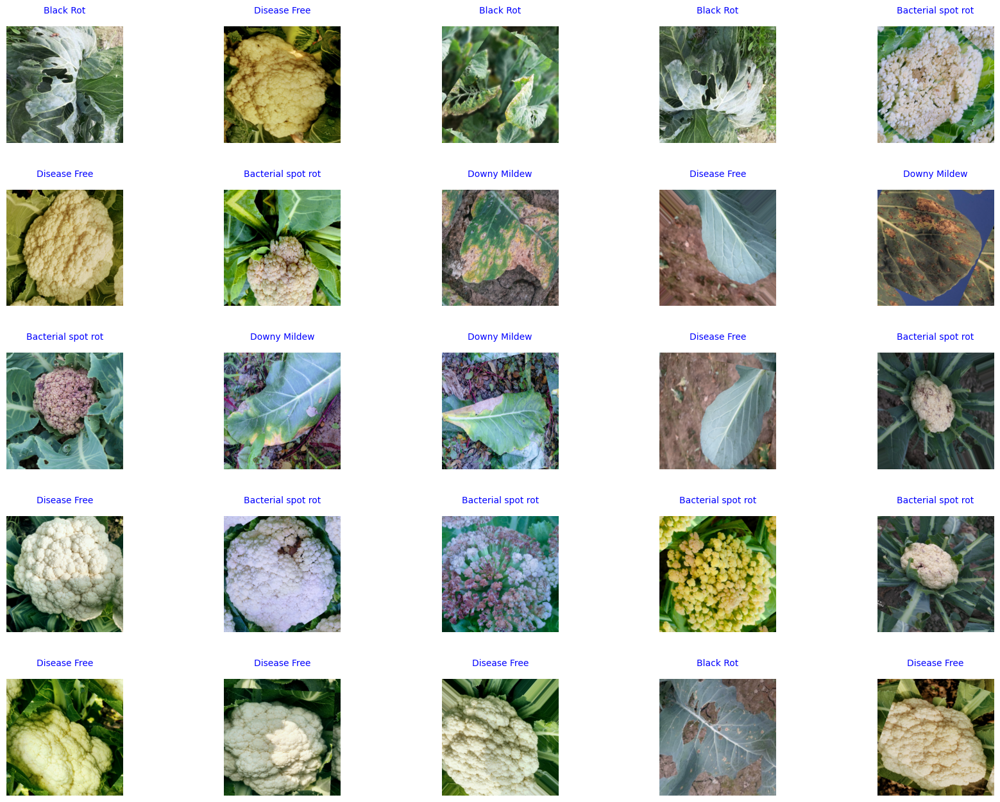

In [ ]:
plt.figure(figsize=(20, 15))
for images, labels in train_dataset.take(1):
    for i in range(25):
        plt.subplot(5,5,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.axis("off")
        im2 = images[i].numpy().astype("uint8")
        img2 = tf.expand_dims(im2, 0)
        predict = Plant_Leaf_Model.predict(img2)
        predicted= class_names[np.argmax(predict)]
        actual = class_names [labels[i].numpy().astype("uint8")]
        if (actual == predicted):
            plt.title(predicted, fontsize=10, color= 'blue', pad=15);
        else :
            plt.title(actual, fontsize=10, color= 'red' ,pad=15);
        plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9,
                            top=0.9, wspace=0.4,hspace=0.4)

**Plotting Accuracy**

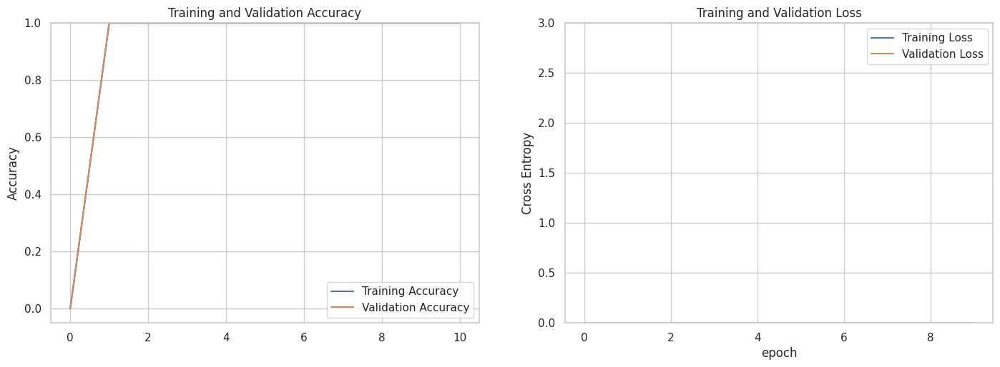

In [ ]:
acc = [0.] + history.history['accuracy']
val_acc = [0.] + history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(17, 12))
plt.subplot(2, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,3.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

3/3 [==============================] - 13s 4s/step


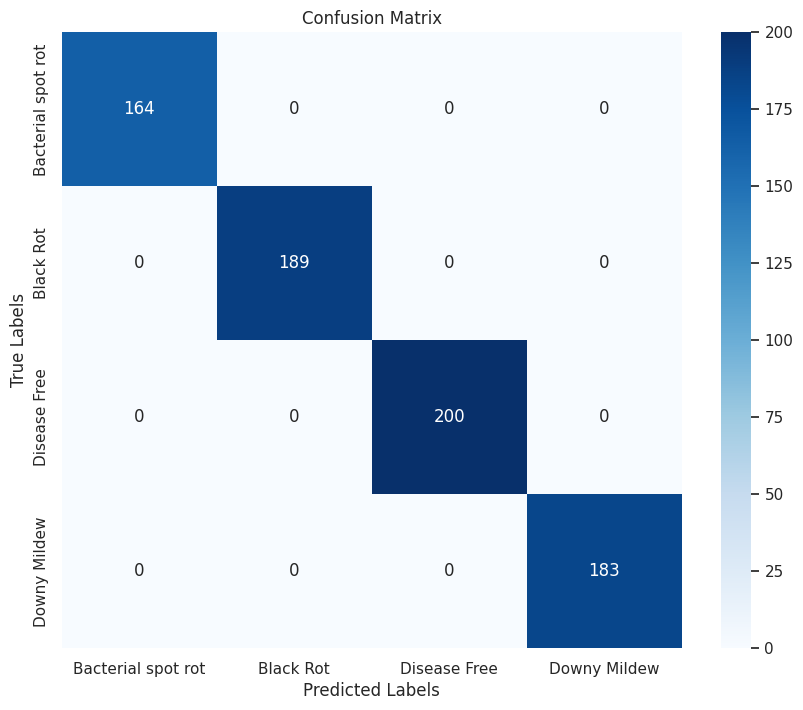

Confusion Matrix:
[[164   0   0   0]
 [  0 189   0   0]
 [  0   0 200   0]
 [  0   0   0 183]]


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Get the true labels and predicted labels
true_labels = []
predicted_labels = []

for images, labels in validation_dataset:
    predictions = Plant_Leaf_Model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)
    true_labels.extend(labels.numpy())
    predicted_labels.extend(predicted_classes)

# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Print confusion matrix separately
print("Confusion Matrix:")
print(conf_matrix)




In [ ]:
# Print classification report separately
print("Classification Report:")
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print(report)

Classification Report:
                    precision    recall  f1-score   support

Bacterial spot rot       1.00      1.00      1.00       164
         Black Rot       1.00      1.00      1.00       189
      Disease Free       1.00      1.00      1.00       200
      Downy Mildew       1.00      1.00      1.00       183

          accuracy                           1.00       736
         macro avg       1.00      1.00      1.00       736
      weighted avg       1.00      1.00      1.00       736

